In [1]:
!nvidia-smi

Tue Dec  9 15:20:44 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   56C    P8             11W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
import os
HOME = os.getcwd()
print(HOME)

/content


In [3]:


!pip install ultralytics --quiet

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics 8.3.235 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 38.2/112.6 GB disk)


In [4]:
from ultralytics import YOLO
from IPython.display import display, Image
import torch

In [5]:
!mkdir {HOME}/datasets
%cd {HOME}/datasets

!pip install roboflow --quiet

from roboflow import Roboflow
rf = Roboflow(api_key="aM8JLeyAG72pTId9t6zj")
project = rf.workspace("ezer-01efc").project("classification-dataset4-zig5s")
version = project.version(2)
dataset = version.download("folder")

/content/datasets
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.9/89.9 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 14.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 87.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 126.1 MB/s eta 0:00:00
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Classification-Dataset4-2 in folder:: 100%|██████████| 1435/1435 [00:00<00:00, 6238.26it/s]


In [6]:
%cd {HOME}


/content


In [8]:
%cd {HOME}

model = YOLO('yolov8s-cls.pt')

data = '/content/datasets/Classification-Dataset4-2'

model.train(data=data, epochs=10, batch=16, optimizer='Adam', lr0=0.001, patience=0, cos_lr=True)


/content
Ultralytics 8.3.235 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/content/datasets/Classification-Dataset4-2, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=224, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s-cls.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train2, nbs=64, nms=False, opset=None, optimize=False, optimizer=Adam, overlap_mask=True, patience=0, perspect

ultralytics.utils.metrics.ClassifyMetrics object with attributes:

confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7b892cbea420>
curves: []
curves_results: []
fitness: 0.9542253613471985
keys: ['metrics/accuracy_top1', 'metrics/accuracy_top5']
results_dict: {'metrics/accuracy_top1': 0.908450722694397, 'metrics/accuracy_top5': 1.0, 'fitness': 0.9542253613471985}
save_dir: PosixPath('/content/runs/classify/train2')
speed: {'preprocess': 0.2288841161972369, 'inference': 0.8681171161981638, 'loss': 0.00030438732338411743, 'postprocess': 0.00068114436632487}
task: 'classify'
top1: 0.908450722694397
top5: 1.0

In [10]:
from ultralytics import YOLO
import torch
import matplotlib.pyplot as plt


model = YOLO('yolov8s-cls.pt')


data = '/content/datasets/Classification-Dataset4-2'
epochs = 10
batch_size = 16
initial_lr = 0.001


model.train(
    data=data,
    epochs=epochs,
    batch=batch_size,
    optimizer='Adam',
    lr0=initial_lr,
    patience=0,
    cos_lr=True
)





Ultralytics 8.3.235 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/content/datasets/Classification-Dataset4-2, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=224, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s-cls.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train4, nbs=64, nms=False, opset=None, optimize=False, optimizer=Adam, overlap_mask=True, patience=0, perspective=0.0, 

ultralytics.utils.metrics.ClassifyMetrics object with attributes:

confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7b896ff352b0>
curves: []
curves_results: []
fitness: 0.9542253613471985
keys: ['metrics/accuracy_top1', 'metrics/accuracy_top5']
results_dict: {'metrics/accuracy_top1': 0.908450722694397, 'metrics/accuracy_top5': 1.0, 'fitness': 0.9542253613471985}
save_dir: PosixPath('/content/runs/classify/train4')
speed: {'preprocess': 0.3255436866196869, 'inference': 0.8769266619718967, 'loss': 0.00046515140824545005, 'postprocess': 0.0007208521135997754}
task: 'classify'
top1: 0.908450722694397
top5: 1.0

In [12]:
from ultralytics import YOLO
import torch
import matplotlib.pyplot as plt
from torch.utils.tensorboard import SummaryWriter
import os


model = YOLO('yolov8s-cls.pt')


data = '/content/datasets/Classification-Dataset4-2'
epochs = 10
batch_size = 16
initial_lr = 0.001



output_dir = '/content/runs/classify/train_custom_lr_schedule'


os.makedirs(output_dir, exist_ok=True)


model.train(
    data=data,
    epochs=epochs,
    batch=batch_size,
    optimizer='Adam',
    lr0=initial_lr,
    patience=0,
    cos_lr=True,
    project=os.path.dirname(output_dir),
    name=os.path.basename(output_dir)
)




Ultralytics 8.3.235 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/content/datasets/Classification-Dataset4-2, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=224, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s-cls.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train_custom_lr_schedule2, nbs=64, nms=False, opset=None, optimize=False, optimizer=Adam, overlap_mask=True, patience=0

ultralytics.utils.metrics.ClassifyMetrics object with attributes:

confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7b88e8351220>
curves: []
curves_results: []
fitness: 0.9542253613471985
keys: ['metrics/accuracy_top1', 'metrics/accuracy_top5']
results_dict: {'metrics/accuracy_top1': 0.908450722694397, 'metrics/accuracy_top5': 1.0, 'fitness': 0.9542253613471985}
save_dir: PosixPath('/content/runs/classify/train_custom_lr_schedule2')
speed: {'preprocess': 0.114694031690882, 'inference': 1.2169600704214005, 'loss': 0.0007236866210892196, 'postprocess': 0.0010211866189090127}
task: 'classify'
top1: 0.908450722694397
top5: 1.0

In [13]:
!ls -la {HOME}/runs/classify/train/

total 1208
drwxr-xr-x 3 root root   4096 Dec  9 15:34 .
drwxr-xr-x 9 root root   4096 Dec  9 15:36 ..
-rw-r--r-- 1 root root   1565 Dec  9 15:21 args.yaml
-rw-r--r-- 1 root root 120924 Dec  9 15:23 confusion_matrix_normalized.png
-rw-r--r-- 1 root root 101318 Dec  9 15:23 confusion_matrix.png
-rw-r--r-- 1 root root    139 Dec  9 15:36 events.out.tfevents.1765294471.b5a5f971d814.675.0
-rw-r--r-- 1 root root    747 Dec  9 15:23 results.csv
-rw-r--r-- 1 root root 123583 Dec  9 15:23 results.png
-rw-r--r-- 1 root root 101594 Dec  9 15:21 train_batch0.jpg
-rw-r--r-- 1 root root 100966 Dec  9 15:21 train_batch1.jpg
-rw-r--r-- 1 root root  93970 Dec  9 15:21 train_batch2.jpg
-rw-r--r-- 1 root root  84712 Dec  9 15:23 val_batch0_labels.jpg
-rw-r--r-- 1 root root  86813 Dec  9 15:23 val_batch0_pred.jpg
-rw-r--r-- 1 root root  94314 Dec  9 15:23 val_batch1_labels.jpg
-rw-r--r-- 1 root root  95717 Dec  9 15:23 val_batch1_pred.jpg
-rw-r--r-- 1 root root  90656 Dec  9 15:23 val_batch2_labels.jpg
-r

In [14]:
!cat {HOME}/runs/classify/train/results.csv

epoch,time,train/loss,metrics/accuracy_top1,metrics/accuracy_top5,val/loss,lr/pg0,lr/pg1,lr/pg2
1,11.7149,1.11914,0.70775,1,0.74333,0.0675323,0.000327957,0.000327957
2,29.3583,0.72618,0.76056,1,0.58011,0.0344668,0.000595823,0.000595823
3,39.0782,0.55762,0.84155,1,0.46935,0.00133532,0.000797688,0.000797688
4,48.4661,0.40748,0.86268,1,0.42069,0.000703,0.000703,0.000703
5,58.331,0.34538,0.85563,1,0.45447,0.000604,0.000604,0.000604
6,68.4835,0.34246,0.87324,1,0.3594,0.000505,0.000505,0.000505
7,78.6151,0.23971,0.87324,1,0.39151,0.000406,0.000406,0.000406
8,87.4551,0.22437,0.90493,1,0.33102,0.000307,0.000307,0.000307
9,97.7647,0.17222,0.90141,1,0.29351,0.000208,0.000208,0.000208
10,107.761,0.15268,0.89437,1,0.30527,0.000109,0.000109,0.000109


/content


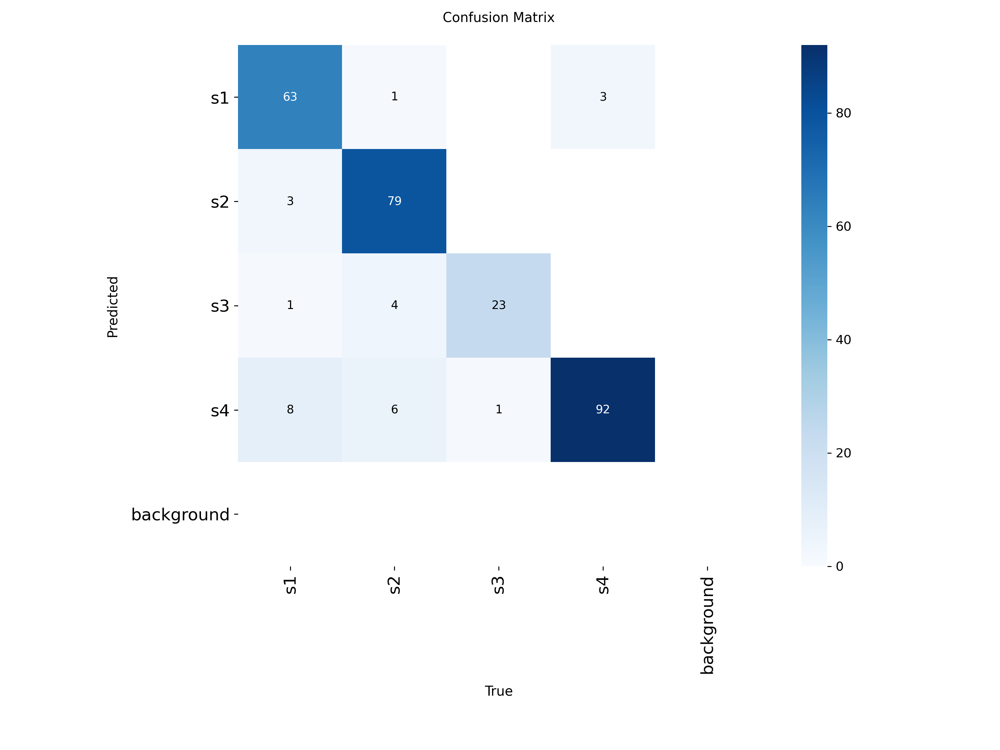

In [16]:
%cd {HOME}
from IPython.display import Image
Image(filename=f'{HOME}/runs/classify/train/confusion_matrix.png', width=600)

In [31]:
%cd {HOME}

!yolo task=classify mode=val model={HOME}/runs/classify/train_custom_lr_schedule2/weights/best.pt data={dataset.location}

/content
Ultralytics 8.3.235 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8s-cls summary (fused): 30 layers, 5,080,324 parameters, 0 gradients, 12.5 GFLOPs
train: /content/datasets/Classification-Dataset4-2/train... found 992 images in 4 classes ✅ 
val: /content/datasets/Classification-Dataset4-2/valid... found 284 images in 4 classes ✅ 
test: /content/datasets/Classification-Dataset4-2/test... found 142 images in 4 classes ✅ 
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1285.4±500.3 MB/s, size: 30.2 KB)
val: Scanning /content/datasets/Classification-Dataset4-2/valid... 284 images, 0 corrupt: 100% ━━━━━━━━━━━━ 284/284 5.2Mit/s 0.0s
               classes   top1_acc   top5_acc: 100% ━━━━━━━━━━━━ 18/18 11.6it/s 1.5s
                   all      0.908          1
Speed: 0.3ms preprocess, 3.3ms inference, 0.0ms loss, 0.0ms postprocess per image
Results saved to /content/runs/classify/val
💡 Learn more at https://docs.ultralytics.com/modes/val


In [18]:
%cd {HOME}
!yolo task=classify mode=predict model={HOME}/runs/classify/train/weights/best.pt conf=0.25 source={dataset.location}/test/s1
!yolo task=classify mode=predict model={HOME}/runs/classify/train/weights/best.pt conf=0.25 source={dataset.location}/test/s2
!yolo task=classify mode=predict model={HOME}/runs/classify/train/weights/best.pt conf=0.25 source={dataset.location}/test/s3
!yolo task=classify mode=predict model={HOME}/runs/classify/train/weights/best.pt conf=0.25 source={dataset.location}/test/s4

/content
Ultralytics 8.3.235 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8s-cls summary (fused): 30 layers, 5,080,324 parameters, 0 gradients, 12.5 GFLOPs

image 1/41 /content/datasets/Classification-Dataset4-2/test/s1/metal111_jpg.rf.a202ac57d98815fda0aaaf96fb103536.jpg: 224x224 s1 0.98, s2 0.01, s3 0.01, s4 0.00, 3.6ms
image 2/41 /content/datasets/Classification-Dataset4-2/test/s1/metal130_jpg.rf.70a763ae6ba312cb46fcc6aaf350bb1a.jpg: 224x224 s1 1.00, s3 0.00, s4 0.00, s2 0.00, 3.3ms
image 3/41 /content/datasets/Classification-Dataset4-2/test/s1/metal138_jpg.rf.bb34030f102e10a4d1d583169665f7bc.jpg: 224x224 s1 0.99, s4 0.01, s3 0.00, s2 0.00, 3.0ms
image 4/41 /content/datasets/Classification-Dataset4-2/test/s1/metal152_jpg.rf.a4bbd5d4b8ea55c996651a415476e21a.jpg: 224x224 s1 0.98, s4 0.02, s3 0.00, s2 0.00, 2.9ms
image 5/41 /content/datasets/Classification-Dataset4-2/test/s1/metal159_jpg.rf.c4188ff7261e954b4e765602d4fb0bde.jpg: 224x224 s1 0.96, s4 0.04, s2 0.00, 

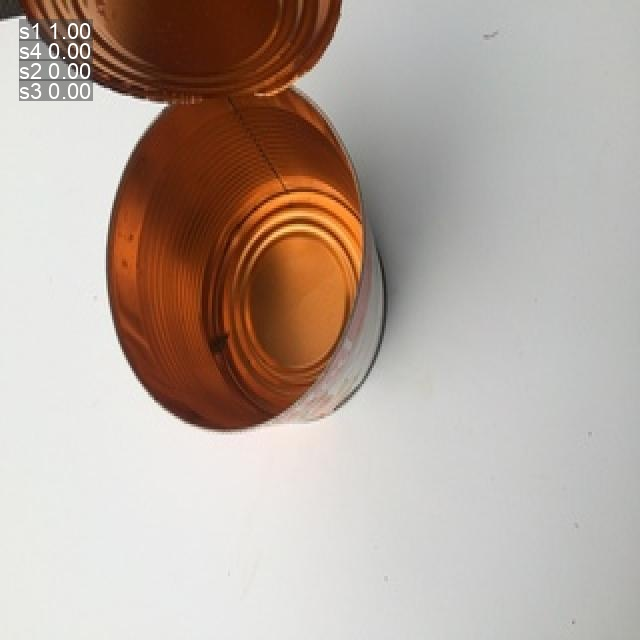

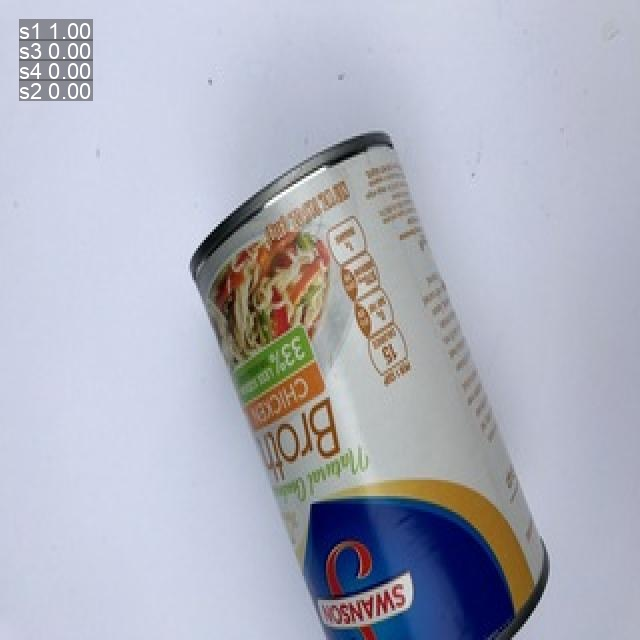

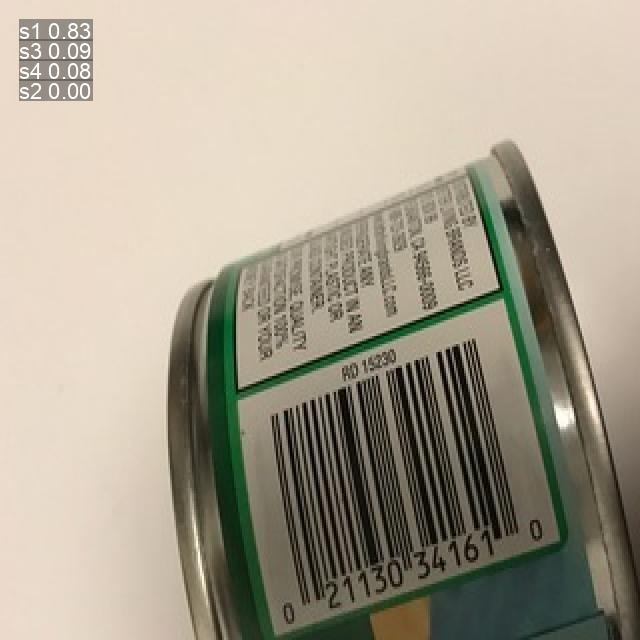

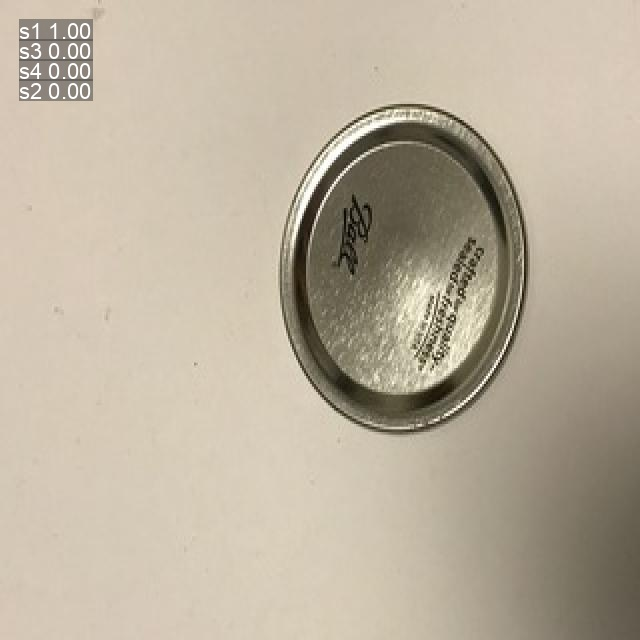

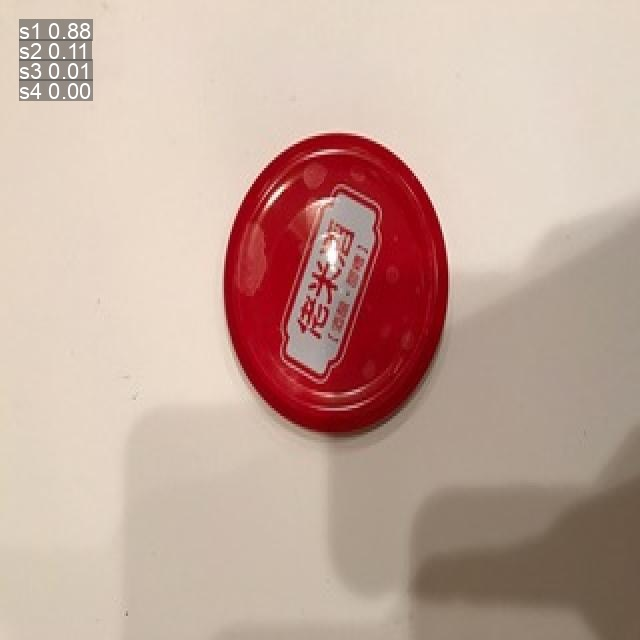

...

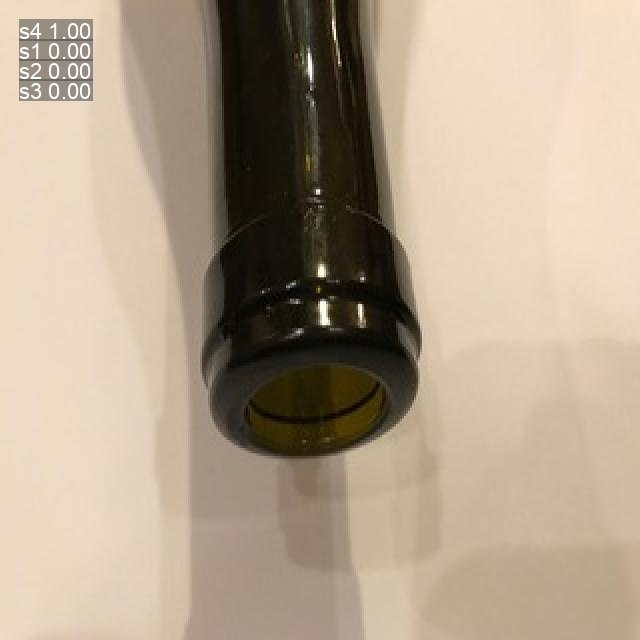

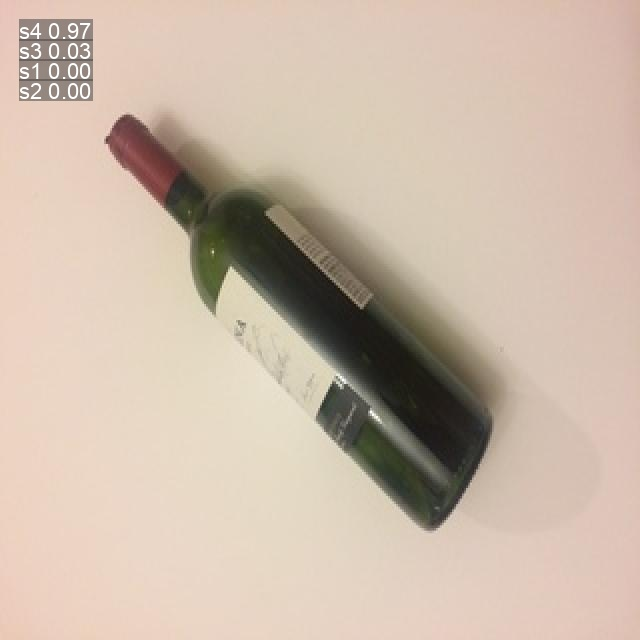

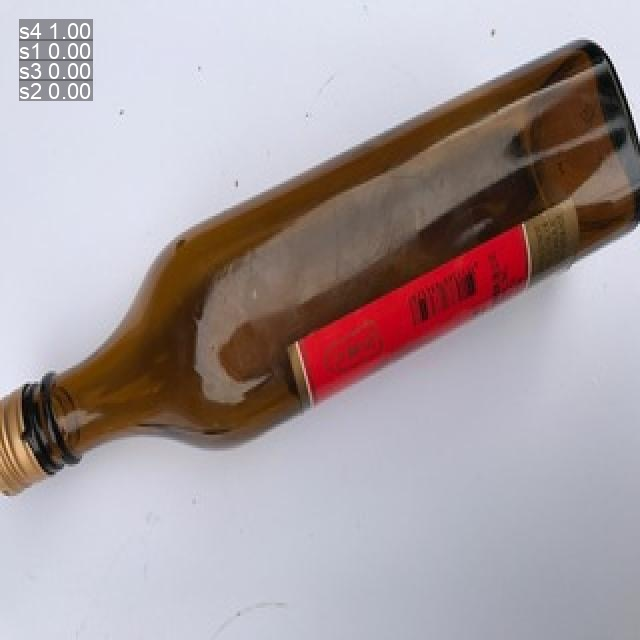

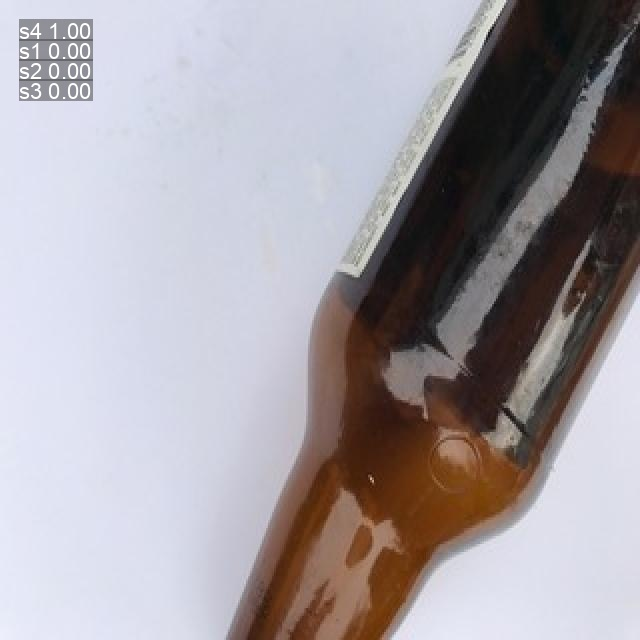

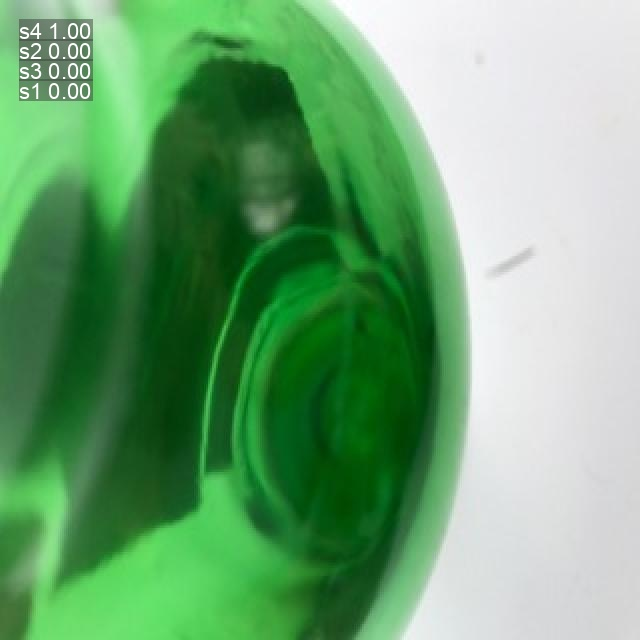

In [19]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/runs/classify/predict/*.jpg'):
      display(Image(filename=image_path, width=600))
      print("\n")
for image_path in glob.glob(f'{HOME}/runs/classify/predict2/*.jpg'):
      display(Image(filename=image_path, width=600))
      print("\n")
for image_path in glob.glob(f'{HOME}/runs/classify/predict3/*.jpg'):
      display(Image(filename=image_path, width=600))
      print("\n")
for image_path in glob.glob(f'{HOME}/runs/classify/predict4/*.jpg'):
      display(Image(filename=image_path, width=600))
      print("\n")

In [35]:
#DEPLOY MODEL

new_version_number = int(dataset.version) + 1
new_version = project.version(new_version_number)
new_version.deploy(model_type="yolov8-cls", model_path=f"{HOME}/runs/classify/train/")

Dependency ultralytics==8.0.196 is required but found version=8.3.235, to fix: `pip install ultralytics==8.0.196`
Would you like to continue with the wrong version of ultralytics? y/n: y
View the status of your deployment at: https://app.roboflow.com/ezer-01efc/classification-dataset4-zig5s/3
Share your model with the world at: https://universe.roboflow.com/ezer-01efc/classification-dataset4-zig5s/model/3


In [38]:
from ultralytics import YOLO
import torch
import matplotlib.pyplot as plt
from torch.utils.tensorboard import SummaryWriter
import os


model = YOLO('yolov8s-cls.pt')


data = '/content/datasets/Classification-Dataset4-2'
epochs = 10
batch_size = 16
initial_lr = 0.001


output_dir = '/content/runs/classify/train_fixed_lr_schedule'


os.makedirs(output_dir, exist_ok=True)



model.train(
    data=data,
    epochs=epochs,
    batch=batch_size,
    optimizer='Adam',
    lr0=initial_lr,
    patience=0,
    cos_lr=True,
    project=os.path.dirname(output_dir),
    name=os.path.basename(output_dir)
)




Ultralytics 8.3.235 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/content/datasets/Classification-Dataset4-2, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=224, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s-cls.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train_fixed_lr_schedule2, nbs=64, nms=False, opset=None, optimize=False, optimizer=Adam, overlap_mask=True, patience=0,

ultralytics.utils.metrics.ClassifyMetrics object with attributes:

confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7b89d3fa06b0>
curves: []
curves_results: []
fitness: 0.9542253613471985
keys: ['metrics/accuracy_top1', 'metrics/accuracy_top5']
results_dict: {'metrics/accuracy_top1': 0.908450722694397, 'metrics/accuracy_top5': 1.0, 'fitness': 0.9542253613471985}
save_dir: PosixPath('/content/runs/classify/train_fixed_lr_schedule2')
speed: {'preprocess': 0.18824352112870388, 'inference': 1.104737588027835, 'loss': 0.00045952464954328683, 'postprocess': 0.03599863027894046}
task: 'classify'
top1: 0.908450722694397
top5: 1.0


image 1/1 /content/téléchargement.jpeg: 224x224 s1 0.55, s2 0.44, s3 0.01, s4 0.00, 3.9ms
Speed: 4.0ms preprocess, 3.9ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
Results saved to /content/runs/classify/predict5
Classe prédite: s1
Confiance: 55.00%


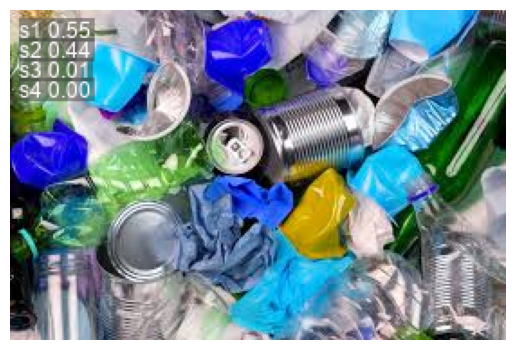

In [39]:
results = model.predict(
    source='/content/téléchargement.jpeg',
    save=True,
    conf=0.5,
    show_labels=True,
    show_conf=True
)


for result in results:
    print(f"Classe prédite: {result.names[result.probs.top1]}")
    print(f"Confiance: {result.probs.top1conf:.2%}")


    plt.imshow(result.plot())
    plt.axis('off')
    plt.show()